# Finding RNAfish spots in 256x256 images using Unet, Conv2d

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from scipy.optimize import curve_fit
from sklearn import cluster, mixture
from PIL import Image
import random
import utils
import glob

In [2]:
data='/media/smc/AutoEncoder/'

# Get data

Load data from file

In [3]:
training_data=np.asarray([plt.imread(f) for f in glob.glob(data+'Training/*.tif')])
training_data=training_data/256

In [4]:
validation_data=np.asarray([plt.imread(f) for f in glob.glob(data+'Validation/*.tif')])
validation_data=validation_data/256

# Design network

Define a function to create a convolutional layer, including conv, relu, maxpool, that can be called multiple times

In [5]:
tf.reset_default_graph()
#Input and output
x=tf.placeholder(dtype=tf.float32, shape=[None, 128,128,3], name='x')
y=tf.placeholder(dtype=tf.float32, shape=[None, 128,128,3], name='y')

xr=x
yr=y

base_scaler=32

#Going down
A1=(tf.layers.conv2d(xr, base_scaler, [5,5], padding='SAME'))
A2=(tf.layers.conv2d(A1, base_scaler, [3,3], padding='SAME'))

B0=tf.nn.max_pool(A2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
B1=(tf.layers.conv2d(B0, 2*base_scaler, [3,3], padding='SAME'))
B2=(tf.layers.conv2d(B1, 2*base_scaler, [3,3], padding='SAME'))

C0=tf.nn.max_pool(B2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
C1=(tf.layers.conv2d(C0, 4*base_scaler, [3,3], padding='SAME'))
C2=(tf.layers.conv2d(C1, 4*base_scaler, [3,3], padding='SAME'))

D0=tf.nn.max_pool(C2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
D1=(tf.layers.conv2d(D0, 8*base_scaler, [3,3], padding='SAME'))
D2=(tf.layers.conv2d(D1, 8*base_scaler, [3,3], padding='SAME'))

E0=tf.nn.max_pool(D2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
E1=(tf.layers.conv2d(E0, 16*base_scaler, [3,3], padding='SAME'))
E2=(tf.layers.conv2d(E1, 16*base_scaler, [3,3], padding='SAME'))

F0=tf.nn.max_pool(E2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
F1=(tf.layers.conv2d(F0, 32*base_scaler, [3,3], padding='SAME'))
F2=(tf.layers.conv2d(F1, 32*base_scaler, [3,3], padding='SAME'))


#Fully connected
G1=tf.reshape(F2,[-1,4*4*32*base_scaler])
G2=tf.layers.dense(G1,256)
latent=tf.layers.dense(G2,256)
G4=tf.layers.dense(latent,4*4*16)
G5=tf.reshape(G4,[-1,4,4,16])

#Coming up
EE0=tf.layers.conv2d_transpose(G5, 8*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
EE1=EE0
EE2=(tf.layers.conv2d(EE1, 16*base_scaler, [3,3], padding='SAME'))
EE3=(tf.layers.conv2d(EE2, 16*base_scaler, [3,3], padding='SAME'))

DD0=tf.layers.conv2d_transpose(EE2, 8*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
DD1=DD0
DD2=(tf.layers.conv2d(DD1, 8*base_scaler, [3,3], padding='SAME'))
DD3=(tf.layers.conv2d(DD2, 8*base_scaler, [3,3], padding='SAME'))

CC0=tf.layers.conv2d_transpose(DD3, 4*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
CC1=CC0
CC2=(tf.layers.conv2d(CC1, 4*base_scaler, [3,3], padding='SAME'))
CC3=(tf.layers.conv2d(CC2, 4*base_scaler, [3,3], padding='SAME'))

BB0=tf.layers.conv2d_transpose(CC3, 2*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#BB0=tf.contrib.layers.conv2d_transpose(C2, 2*base_scaler, kernel_size=[3,3], stride=[2, 2], padding='SAME')
BB1=BB0
BB2=(tf.layers.conv2d(BB1, 2*base_scaler, [3,3], padding='SAME'))
BB3=(tf.layers.conv2d(BB2, 2*base_scaler, [3,3], padding='SAME'))

AA0=tf.layers.conv2d_transpose(BB3, base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
AA1=AA0
AA2=(tf.layers.conv2d(AA1, base_scaler, [3,3], padding='SAME'))
AA3=(tf.layers.conv2d(AA2, base_scaler, [3,3], padding='SAME'))

#logits=utils.leaky_relu(tf.layers.conv2d(AA3, 3, [1,1], padding='SAME'))
logits=tf.nn.relu(tf.layers.conv2d(AA3, 3, [1,1], padding='SAME'))
probs=tf.tanh(logits, name='probabilities')

diff=tf.subtract(probs, yr)
LSQ=tf.multiply(diff,diff)
#Added this to make the outlines more potent in error function
#OutError, MaskError=tf.split(LSQ, [1,1], 3)
#loss=1*tf.reduce_mean(OutError)+0.1*tf.reduce_mean(MaskError)
loss=tf.reduce_mean(LSQ, name='error')

train_op=tf.train.AdamOptimizer(learning_rate=0.0001, name='trainer').minimize(loss)

# Training on easy set

0
Training loss:  0.298502
(20, 128, 128, 3)
Validation loss:  0.295355


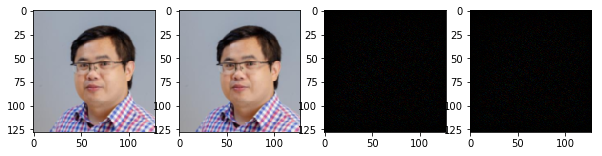

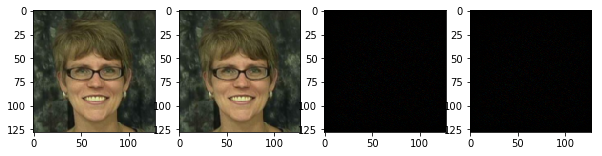

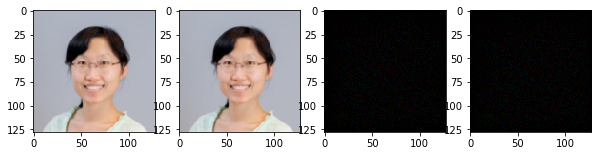

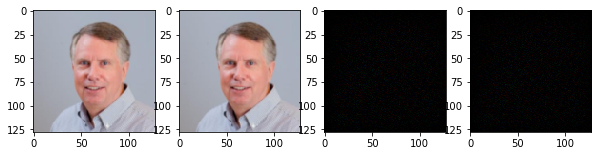

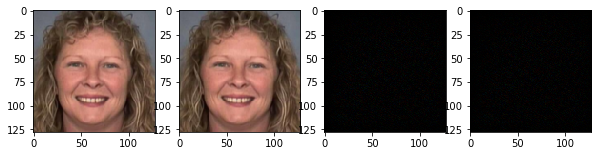

100
Training loss:  0.0210825
(20, 128, 128, 3)
Validation loss:  0.026183


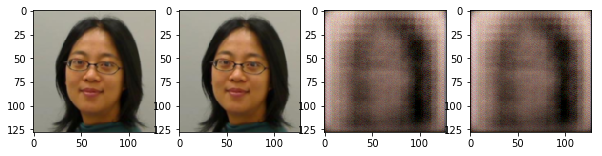

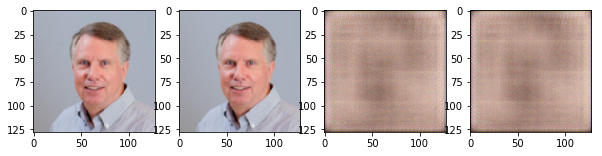

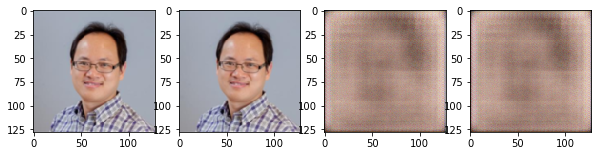

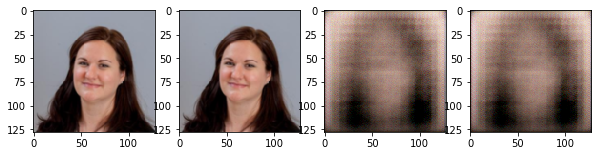

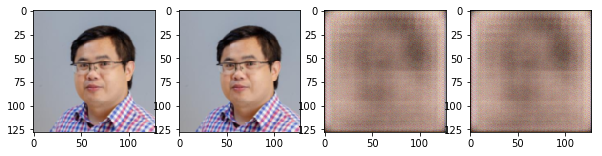

200
Training loss:  0.0166734
(20, 128, 128, 3)
Validation loss:  0.017528


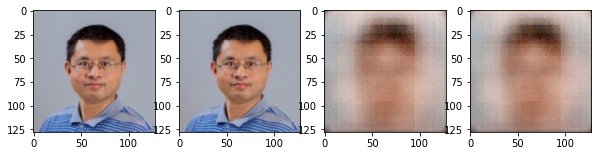

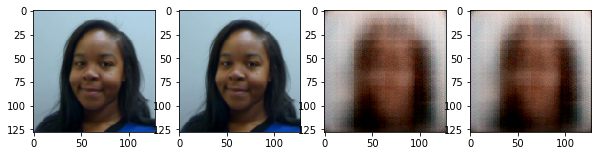

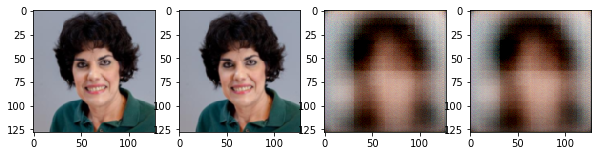

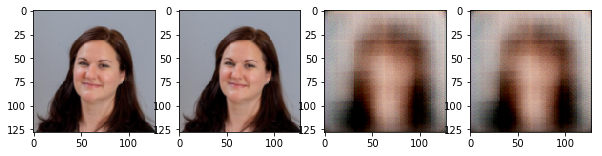

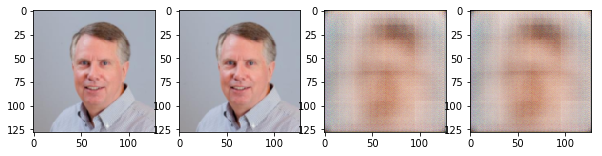

300
Training loss:  0.0123734
(20, 128, 128, 3)
Validation loss:  0.0131654


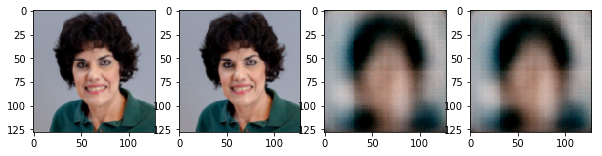

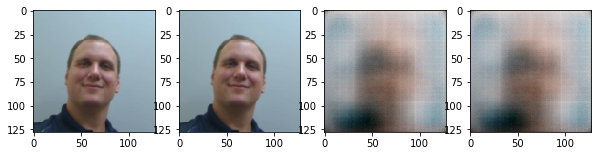

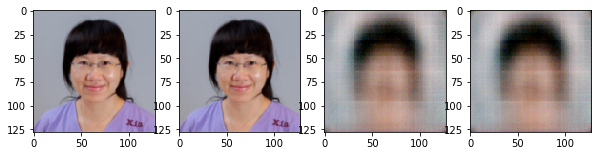

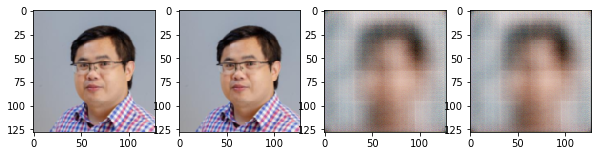

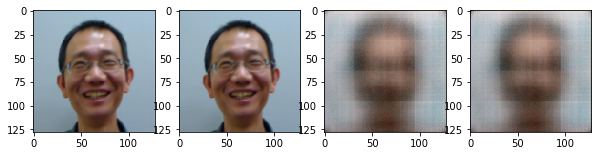

400
Training loss:  0.0112048
(20, 128, 128, 3)
Validation loss:  0.0106733


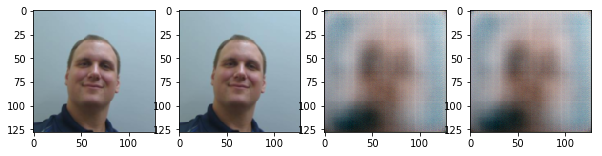

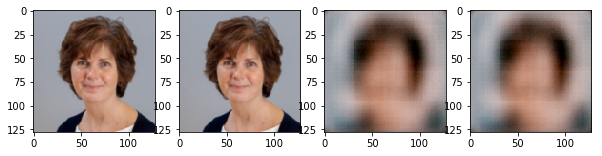

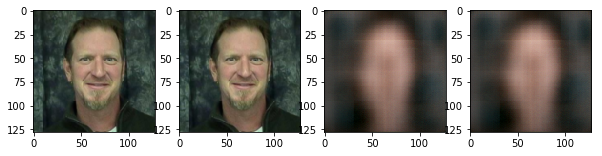

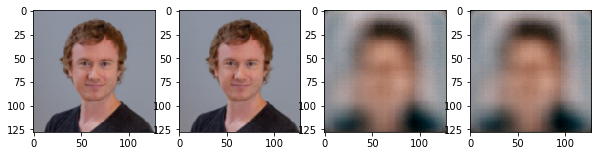

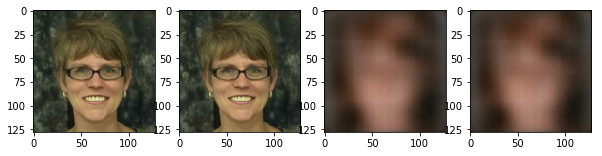

500
Training loss:  0.00990585
(20, 128, 128, 3)
Validation loss:  0.0099641


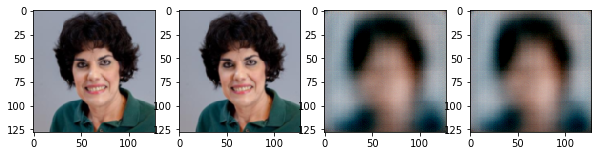

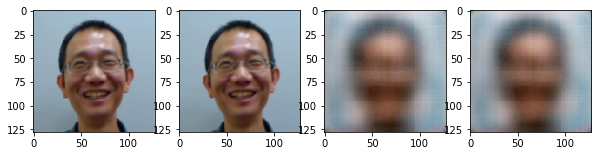

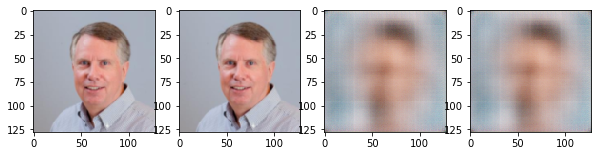

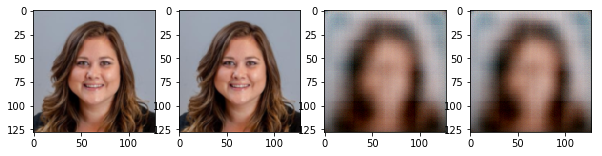

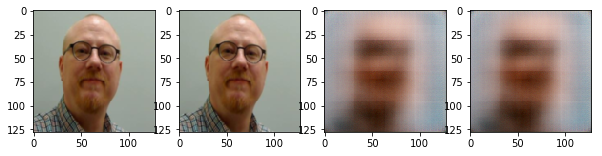

600
Training loss:  0.00887706
(20, 128, 128, 3)
Validation loss:  0.0100365


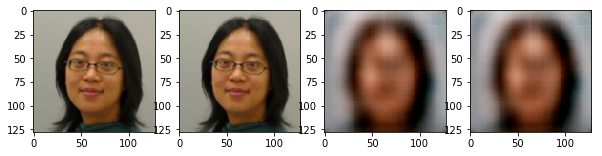

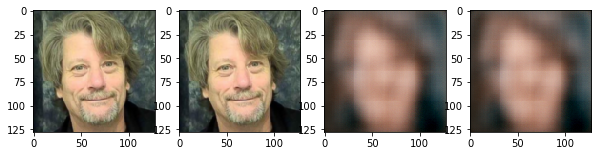

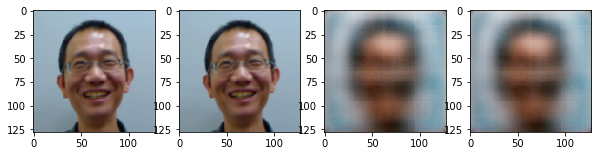

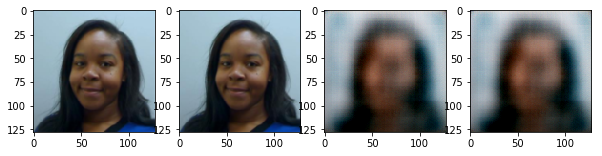

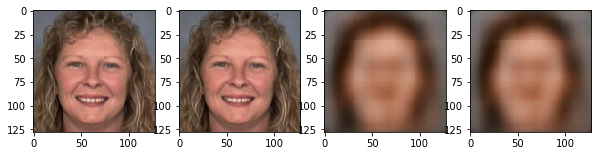

700
Training loss:  0.0089737
(20, 128, 128, 3)
Validation loss:  0.0098449


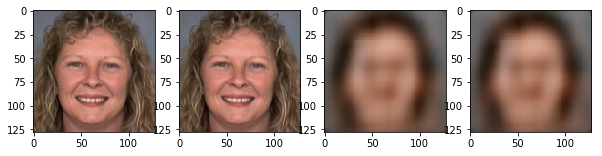

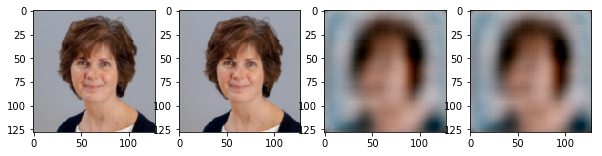

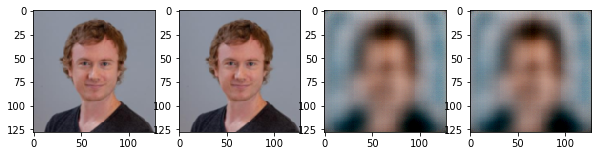

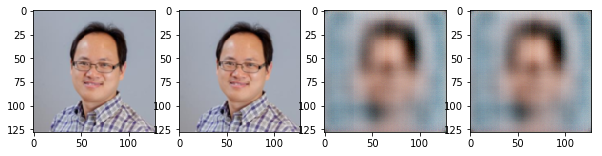

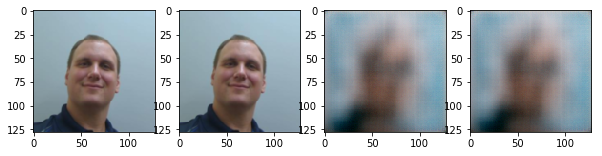

800
Training loss:  0.00723933
(20, 128, 128, 3)
Validation loss:  0.00879063


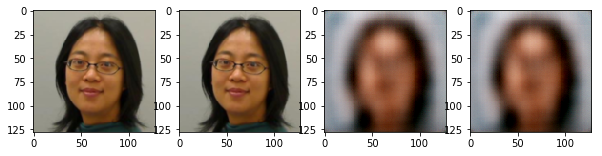

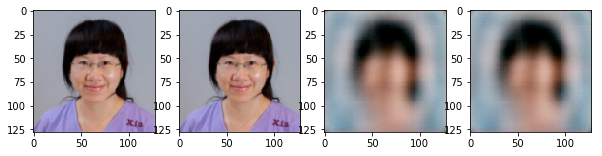

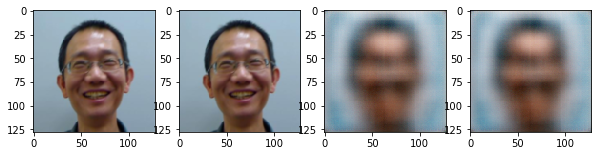

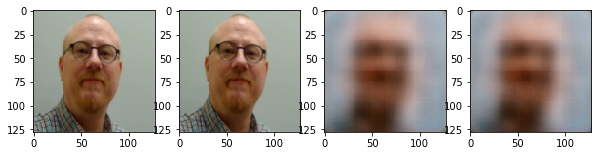

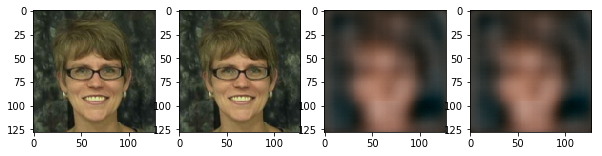

900
Training loss:  0.00718741
(20, 128, 128, 3)
Validation loss:  0.00840348


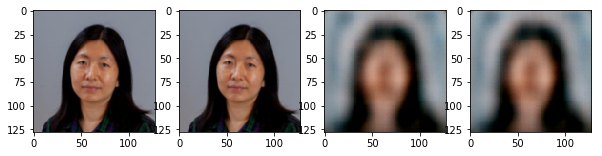

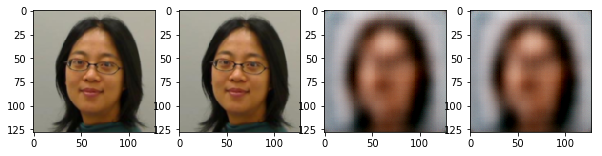

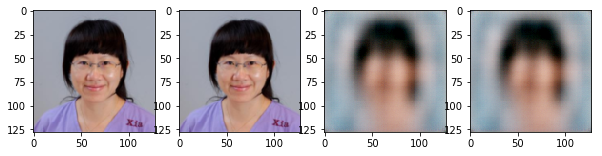

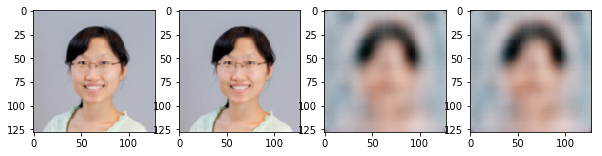

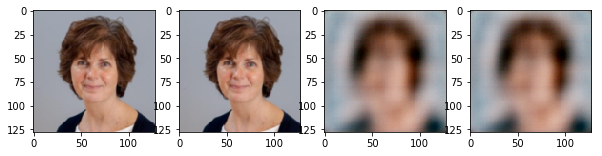

1000
Training loss:  0.00674471
(20, 128, 128, 3)
Validation loss:  0.00763485


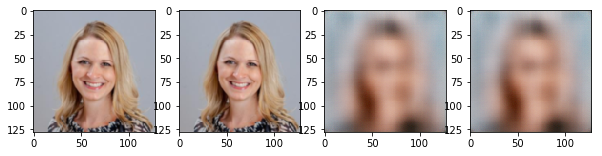

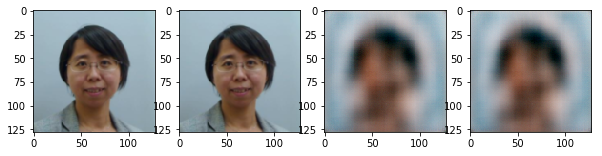

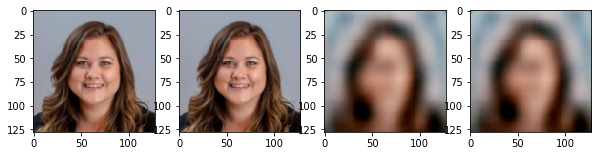

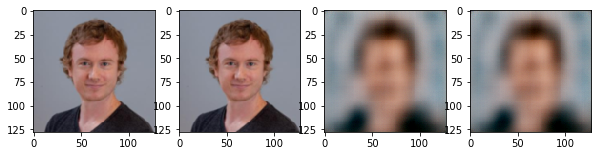

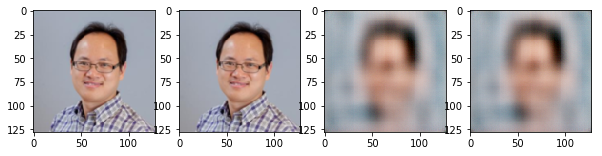

1100
Training loss:  0.00687449
(20, 128, 128, 3)
Validation loss:  0.00795035


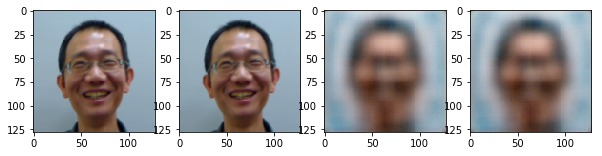

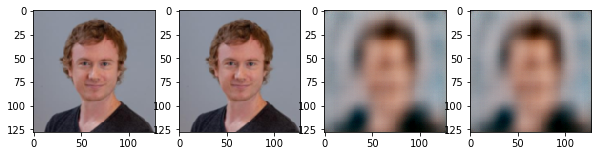

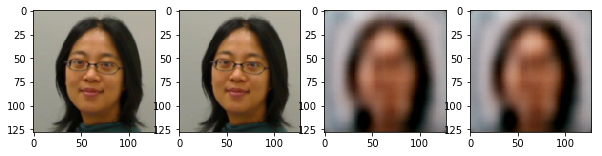

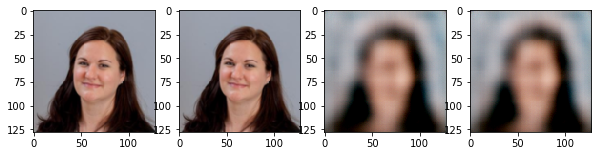

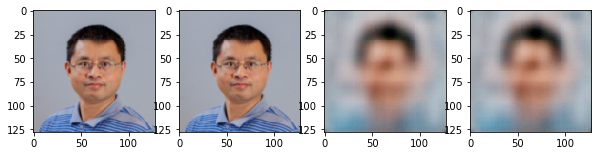

1200
Training loss:  0.00681832
(20, 128, 128, 3)
Validation loss:  0.00741384


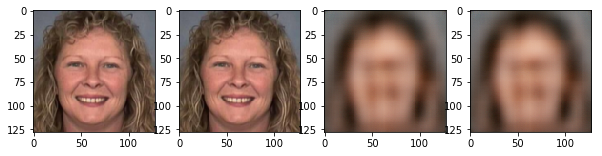

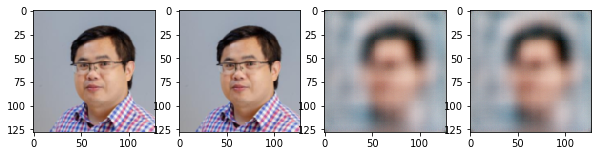

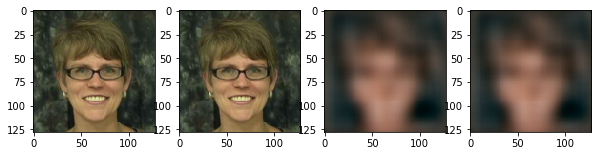

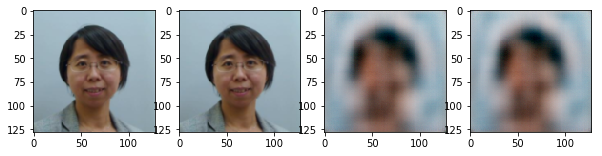

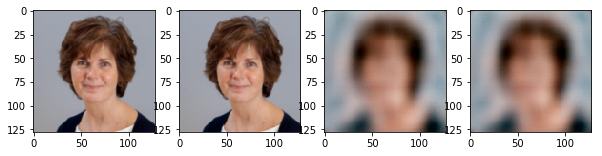

1300
Training loss:  0.00641073
(20, 128, 128, 3)
Validation loss:  0.00734272


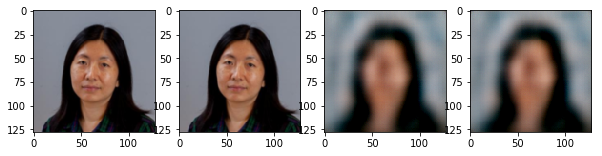

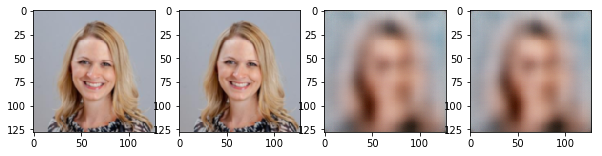

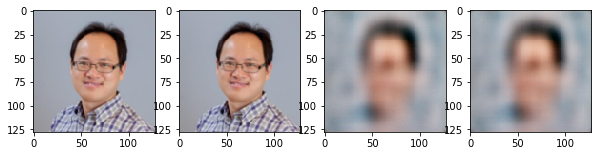

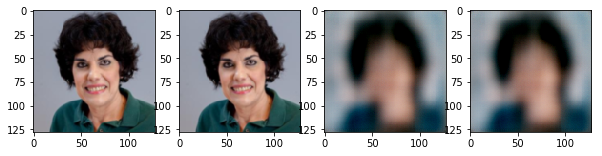

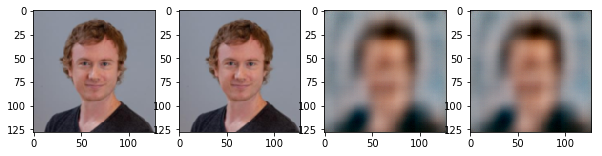

1400
Training loss:  0.00607036
(20, 128, 128, 3)
Validation loss:  0.00729753


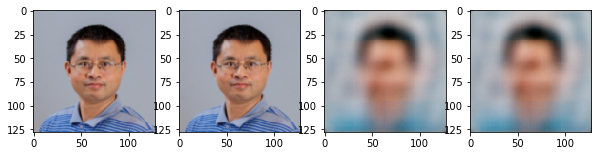

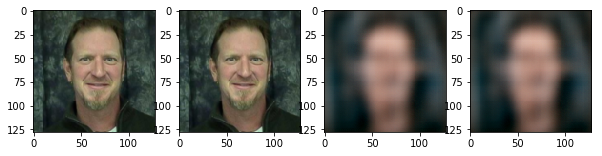

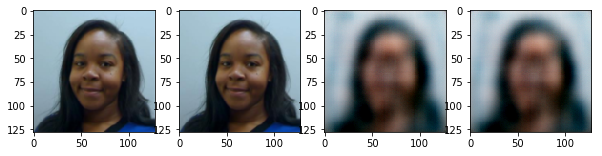

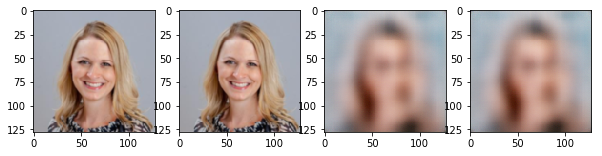

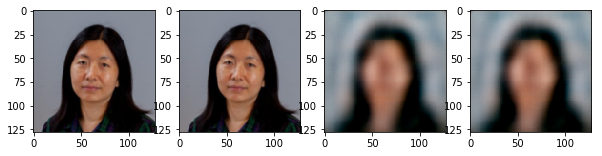

1500
Training loss:  0.00645321
(20, 128, 128, 3)
Validation loss:  0.00763526


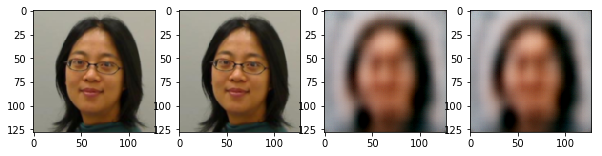

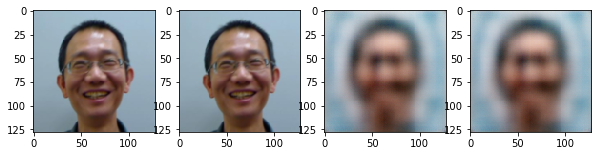

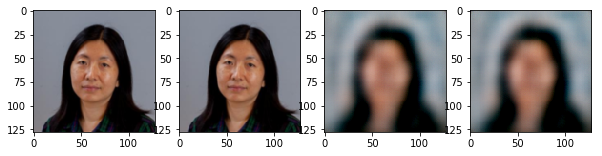

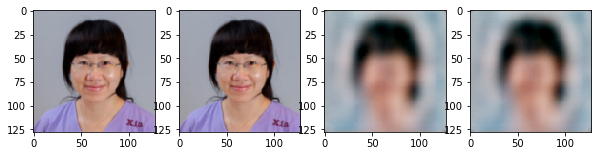

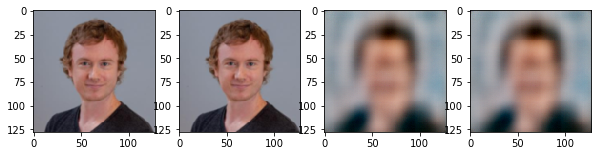

1600
Training loss:  0.00573502
(20, 128, 128, 3)
Validation loss:  0.00687974


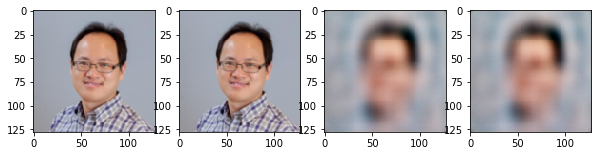

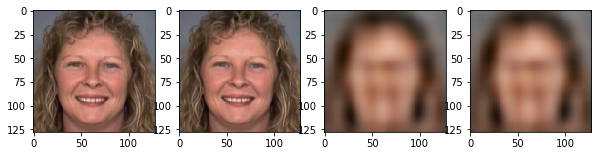

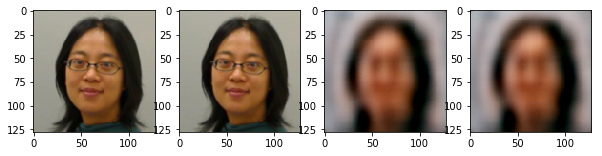

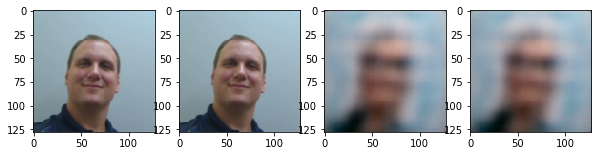

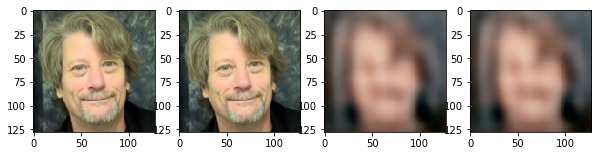

1700
Training loss:  0.00574812
(20, 128, 128, 3)
Validation loss:  0.00674168


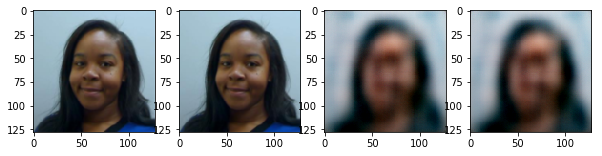

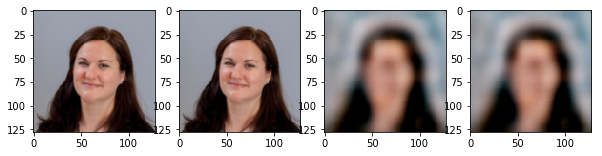

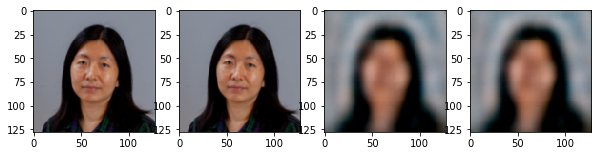

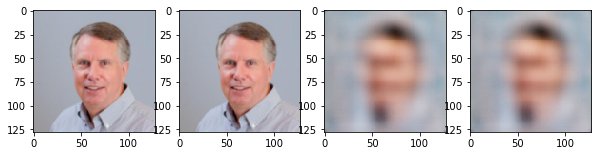

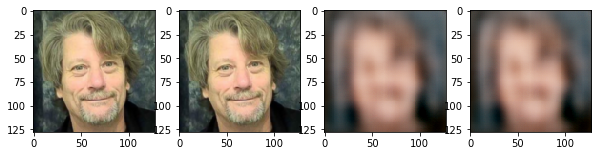

1800
Training loss:  0.00586283
(20, 128, 128, 3)
Validation loss:  0.00662105


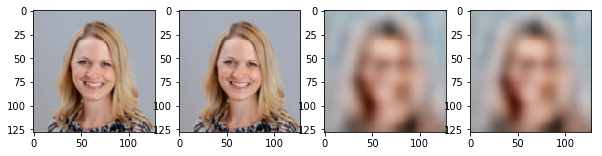

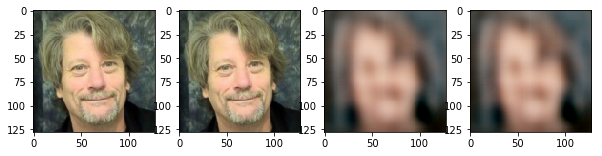

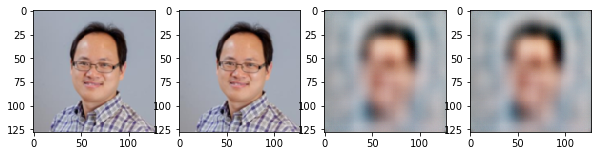

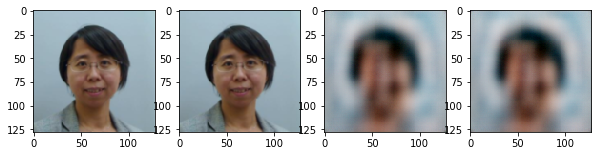

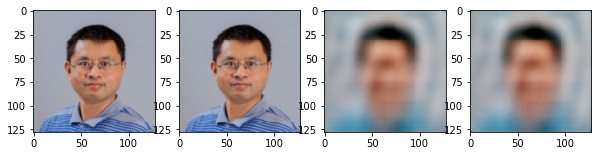

1900
Training loss:  0.00597633
(20, 128, 128, 3)
Validation loss:  0.00636277


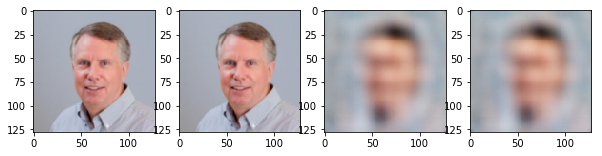

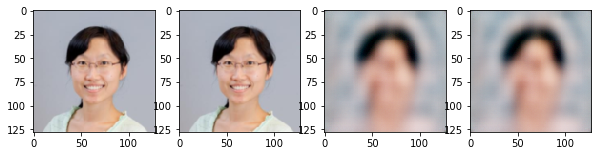

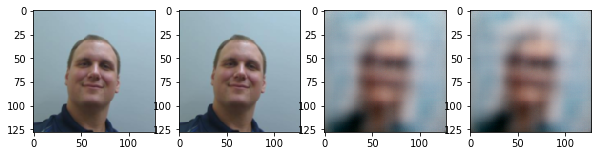

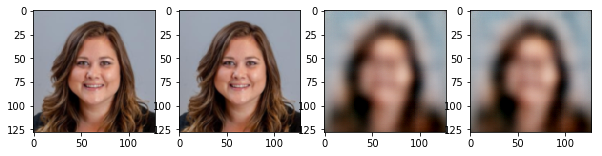

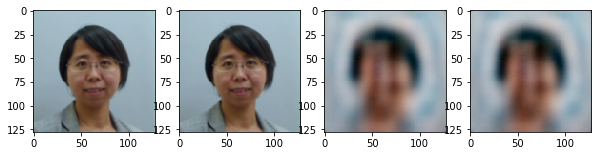

In [6]:
tf.set_random_seed(123456)
sess=tf.Session()
sess.run(tf.global_variables_initializer())

for i in range(2000):
    idx=np.random.choice(training_data.shape[0], replace=False, size=[50])
    cur_train=training_data[idx,:,:,:]
    _,results, losses=sess.run([train_op, probs, loss], feed_dict={x:cur_train, y:cur_train})
    if (i%100==0):
        print(i)
        print("Training loss: ",losses)
        idx=np.random.choice(validation_data.shape[0], replace=False, size=[20])
        #idx=range(0,300)
        sub_validation_data=validation_data[idx, :,:,:]
        results, losses, a,c,cc=sess.run([probs, loss, A1,C2,CC2], feed_dict={x:sub_validation_data, y:sub_validation_data})
        print(results.shape)
        print("Validation loss: ",losses)
        for ti in range (0,5):
            utils.plot_4x1(sub_validation_data[ti,:,:,:], sub_validation_data[ti,:,:,:], results[ti,:,:,:], results[ti,:,:,:])
            plt.show()
#saver = tf.train.Saver()
#saver.save(sess, data+'Model')

# Save

# Process new datafiles using trained network

Load the network that works best

In [7]:
test_data=np.asarray([plt.imread(f) for f in glob.glob(data+'Test/*.tif')])
test_data=test_data/256

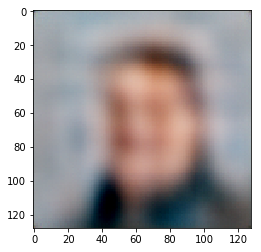

In [9]:
plt.imshow(results[159,:,:,:])

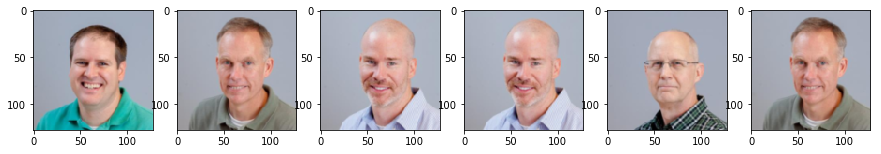

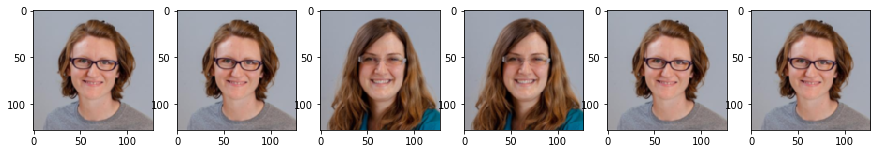

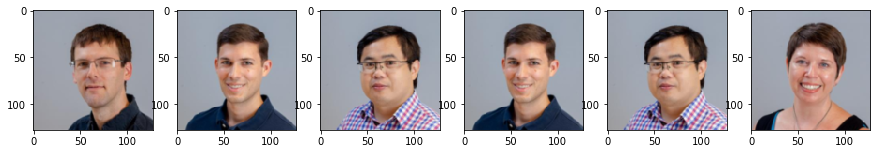

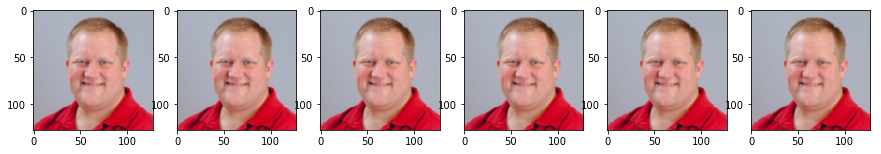

In [62]:
current_data=test_data[[3,6,44,59,92,100,111,115,119,147,148],:,:,:]
results, losses, a, lat=sess.run([probs, loss, A1,latent], feed_dict={x:current_data, y:current_data})
clusters=4
rtnAgg=cluster.AgglomerativeClustering(n_clusters=clusters, affinity='euclidean', linkage='ward').fit_predict(lat)
for c in range(0,clusters):
    subset=current_data[rtnAgg==c,:,:,:]
    idx=np.random.choice(subset.shape[0], replace=True, size=[6])
    utils.plot_6x1(subset[idx[0],:,:,:], subset[idx[1],:,:,:],subset[idx[2],:,:,:],subset[idx[3],:,:,:],subset[idx[4],:,:,:],subset[idx[5],:,:,:])
    plt.show()
        
    

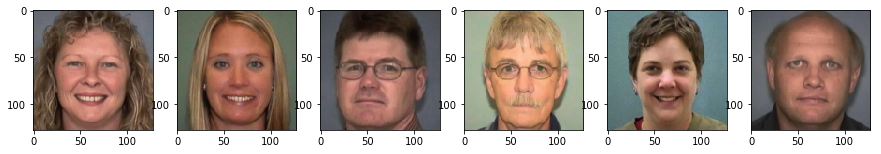

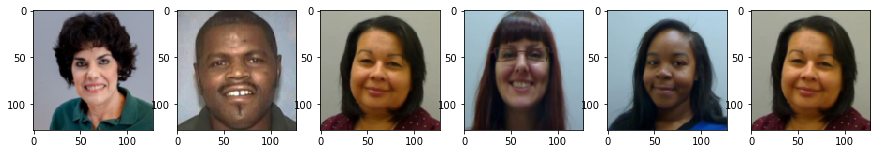

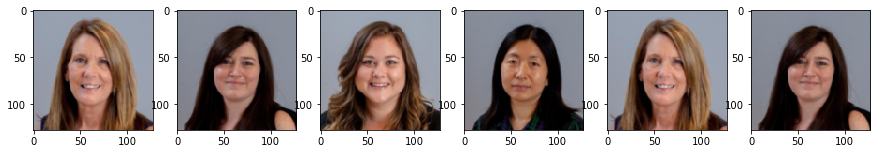

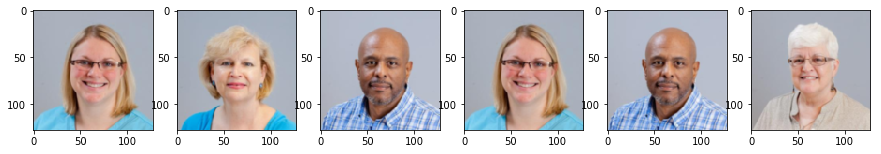

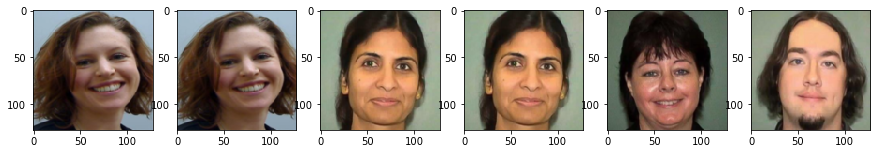

...

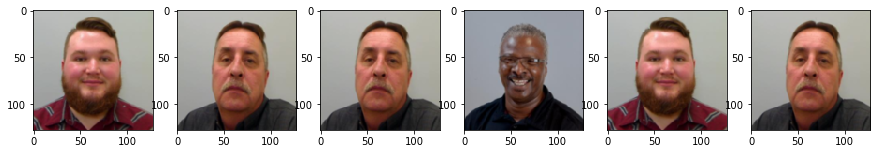

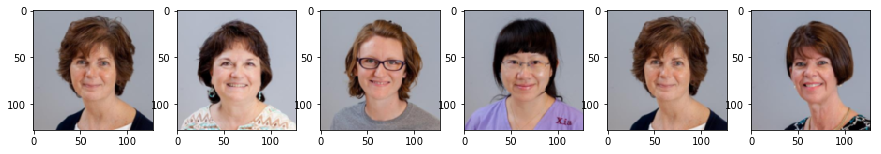

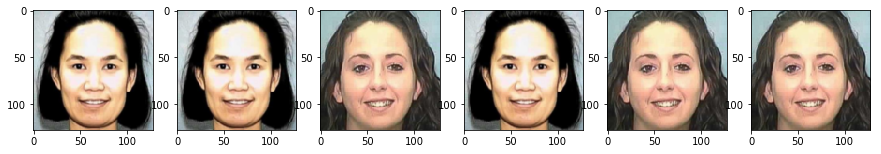

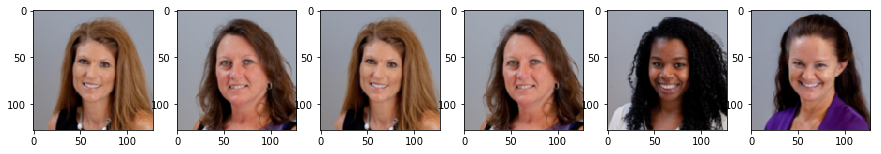

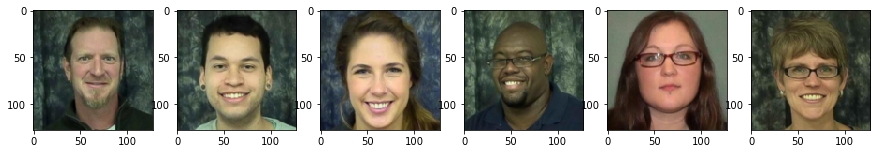

In [64]:
current_data=test_data
results, losses, a, lat=sess.run([probs, loss, A1,latent], feed_dict={x:current_data, y:current_data})
clusters=20
rtnAgg=cluster.AgglomerativeClustering(n_clusters=clusters, affinity='euclidean', linkage='ward').fit_predict(lat)
for c in range(0,clusters):
    subset=current_data[rtnAgg==c,:,:,:]
    idx=np.random.choice(subset.shape[0], replace=True, size=[6])
    utils.plot_6x1(subset[idx[0],:,:,:], subset[idx[1],:,:,:],subset[idx[2],:,:,:],subset[idx[3],:,:,:],subset[idx[4],:,:,:],subset[idx[5],:,:,:])
    plt.show()
        

(array([ 20.,   9.,  16.,   7.,   5.,  16.,   7.,   7.,  14.,  21.,   6.,
          1.,   3.,   6.,  16.,   6.,   5.,   2.,  17.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 <a list of 19 Patch objects>)

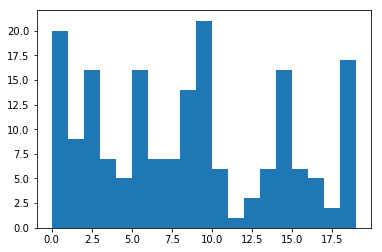

In [68]:
plt.hist(rtnAgg, bins=range(0,20))

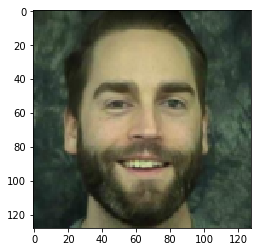

In [32]:
plt.imshow(test_data[0,:,:,:])

/home/smc/anaconda3/envs/tflow/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


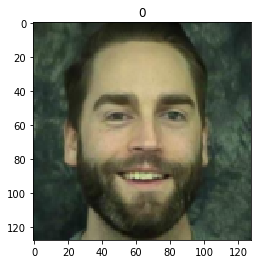

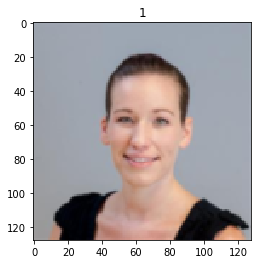

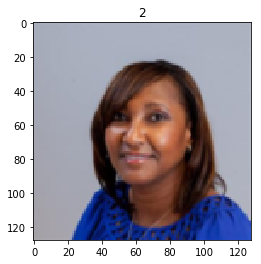

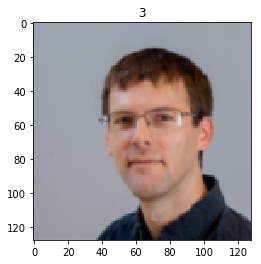

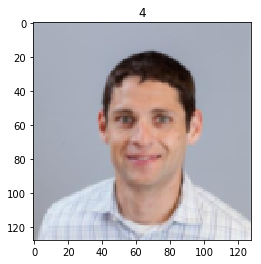

...

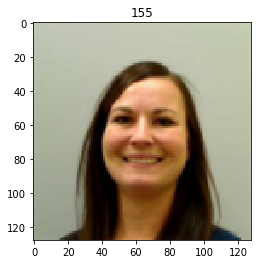

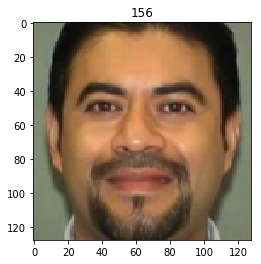

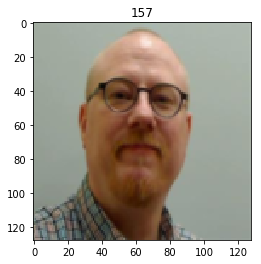

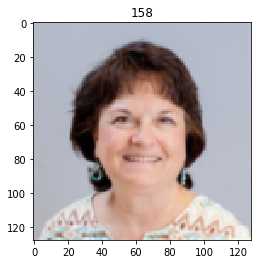

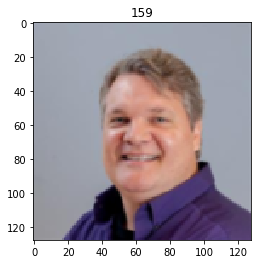

In [33]:
for i in range(0,160):
    plt.figure()
    plt.imshow(test_data[i,:,:,:])
    plt.title(i)

In [15]:
rtnAgg

array([1, 0, 4, 0, 2, 1, 0, 0, 3, 2, 3, 2, 3, 3, 1, 1, 2, 1, 4, 3, 4, 2, 2,
       0, 3, 1, 4, 0, 1, 0, 0, 4, 1, 0, 2, 2, 4, 3, 1, 0, 0, 0, 2, 2, 4, 0,
       0, 1, 2, 3, 0, 1, 3, 1, 0, 3, 4, 4, 3, 2, 4, 2, 4, 4, 2, 4, 3, 0, 4,
       1, 2, 0, 0, 3, 4, 1, 2, 0, 2, 2, 2, 3, 0, 4, 4, 0, 0, 0, 0, 1, 4, 0,
       0, 1, 4, 1, 3, 0, 2, 1, 2, 4, 3, 1, 3, 2, 0, 1, 1, 4, 2, 0, 2, 0, 1,
       0, 4, 1, 0, 0, 1, 1, 1, 0, 3, 3, 4, 1, 1, 3, 0, 3, 4, 3, 4, 1, 2, 2,
       0, 1, 1, 3, 4, 1, 2, 0, 1, 0, 2, 0, 1, 0, 1, 2, 4, 4, 1, 3, 2, 0, 1,
       3, 1, 2, 2, 0, 3, 0, 1, 0, 2, 1, 0, 1, 0, 1, 0, 2, 3, 4, 4, 2, 1, 3])

In [39]:
saver = tf.train.Saver()


data_model=data
saver.restore(sess,tf.train.latest_checkpoint(data_model))

INFO:tensorflow:Restoring parameters from /media/smc/TransmittedYeast/Model


Function for processing a file

In [41]:
def process_file(sess, file_name):
    true_test2_data=utils.get_raw_float_image(file_name, [1,256,256,3])[:,:,:,[0]]/40000.0
    true_test2_truth=utils.get_raw_float_image(file_name, [1,256,256,3])[:,:,:,[1,2]]
    true_test2_truth[:,:,:,0]=true_test2_truth[:,:,:,0]/32000.0
    true_test2_truth[:,:,:,1]=true_test2_truth[:,:,:,1]/255.0
    print(np.std(true_test2_data))
    print(np.mean(true_test2_data))
    
    true_test2_data=true_test2_data/np.std(true_test2_data)*0.02
    true_test2_data=true_test2_data-np.mean(true_test2_data)+0.55

    print(np.std(true_test2_data))
    print(np.mean(true_test2_data))
    
    
    num_images=true_test2_data.shape[0]
    output=np.zeros([num_images,256,256,3])
    process_batch_size=50
    print('Starting')
    for t in range(0,num_images,process_batch_size):
        endrng=np.min((t+process_batch_size,num_images))
        sub_validation_data=true_test2_data[t:(t+process_batch_size), :,:,:]
        sub_validation_truth=true_test2_truth[t:(t+process_batch_size), :,:]
        results, losses, a=sess.run([probs, loss, A1], feed_dict={x:sub_validation_data, y:sub_validation_truth})
        output[t:(t+process_batch_size),:,:,0]=sub_validation_data[:,:,:,0]
        output[t:(t+process_batch_size),:,:,1]=results[:,:,:,0]
        output[t:(t+process_batch_size),:,:,2]=results[:,:,:,1]
    print('Done')
    output=np.swapaxes(np.swapaxes(output,3,2),2,1)
    np.place(output, output<0, 0)
    (output*255.0).astype(np.uint8).tofile(file_name[0:-4]+'_outputb.raw')
    print(file_name[0:-4]+'_output.raw')
    return output


In [40]:
output=process_file(sess,data+'RealC.raw')

0.0287344
0.534627
0.02
0.55
Starting
Done
/media/smc/TransmittedYeast/RealC_output.raw


In [70]:
output.shape

(11583, 3, 256, 256)